In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil
from sklearn.model_selection import train_test_split
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import zipfile
from tqdm import tqdm
import os

In [ ]:
def read_and_print_readme(file_path):
  try:
    with open(file_path, 'r') as file:
      content = file.read()
      print(content)
  except FileNotFoundError:
    print(f"File not found: {file_path}")

# read_and_print_readme('/content/drive/MyDrive/GermanSignDetection/GTSDB/ReadMe.txt')

In [ ]:
class_dict = {
    0: "speed limit 20 (prohibitory)",
    1: "speed limit 30 (prohibitory)",
    2: "speed limit 50 (prohibitory)",
    3: "speed limit 60 (prohibitory)",
    4: "speed limit 70 (prohibitory)",
    5: "speed limit 80 (prohibitory)",
    6: "restriction ends 80 (other)",
    7: "speed limit 100 (prohibitory)",
    8: "speed limit 120 (prohibitory)",
    9: "no overtaking (prohibitory)",
    10: "no overtaking (trucks) (prohibitory)",
    11: "priority at next intersection (danger)",
    12: "priority road (other)",
    13: "give way (other)",
    14: "stop (other)",
    15: "no traffic both ways (prohibitory)",
    16: "no trucks (prohibitory)",
    17: "no entry (other)",
    18: "danger (danger)",
    19: "bend left (danger)",
    20: "bend right (danger)",
    21: "bend (danger)",
    22: "uneven road (danger)",
    23: "slippery road (danger)",
    24: "road narrows (danger)",
    25: "construction (danger)",
    26: "traffic signal (danger)",
    27: "pedestrian crossing (danger)",
    28: "school crossing (danger)",
    29: "cycles crossing (danger)",
    30: "snow (danger)",
    31: "animals (danger)",
    32: "restriction ends (other)",
    33: "go right (mandatory)",
    34: "go left (mandatory)",
    35: "go straight (mandatory)",
    36: "go right or straight (mandatory)",
    37: "go left or straight (mandatory)",
    38: "keep right (mandatory)",
    39: "keep left (mandatory)",
    40: "roundabout (mandatory)",
    41: "restriction ends (overtaking) (other)",
    42: "restriction ends (overtaking (trucks)) (other)"
}
Class_no = class_dict.keys()
Class_name = class_dict.values()
Class_no = list(Class_no)
class_name = list(Class_name)
class_name

['speed limit 20 (prohibitory)',
 'speed limit 30 (prohibitory)',
 'speed limit 50 (prohibitory)',
 'speed limit 60 (prohibitory)',
 'speed limit 70 (prohibitory)',
 'speed limit 80 (prohibitory)',
 'restriction ends 80 (other)',
 'speed limit 100 (prohibitory)',
 'speed limit 120 (prohibitory)',
 'no overtaking (prohibitory)',
 'no overtaking (trucks) (prohibitory)',
 'priority at next intersection (danger)',
 'priority road (other)',
 'give way (other)',
 'stop (other)',
 'no traffic both ways (prohibitory)',
 'no trucks (prohibitory)',
 'no entry (other)',
 'danger (danger)',
 'bend left (danger)',
 'bend right (danger)',
 'bend (danger)',
 'uneven road (danger)',
 'slippery road (danger)',
 'road narrows (danger)',
 'construction (danger)',
 'traffic signal (danger)',
 'pedestrian crossing (danger)',
 'school crossing (danger)',
 'cycles crossing (danger)',
 'snow (danger)',
 'animals (danger)',
 'restriction ends (other)',
 'go right (mandatory)',
 'go left (mandatory)',
 'go stra

# Check files in Sign folder

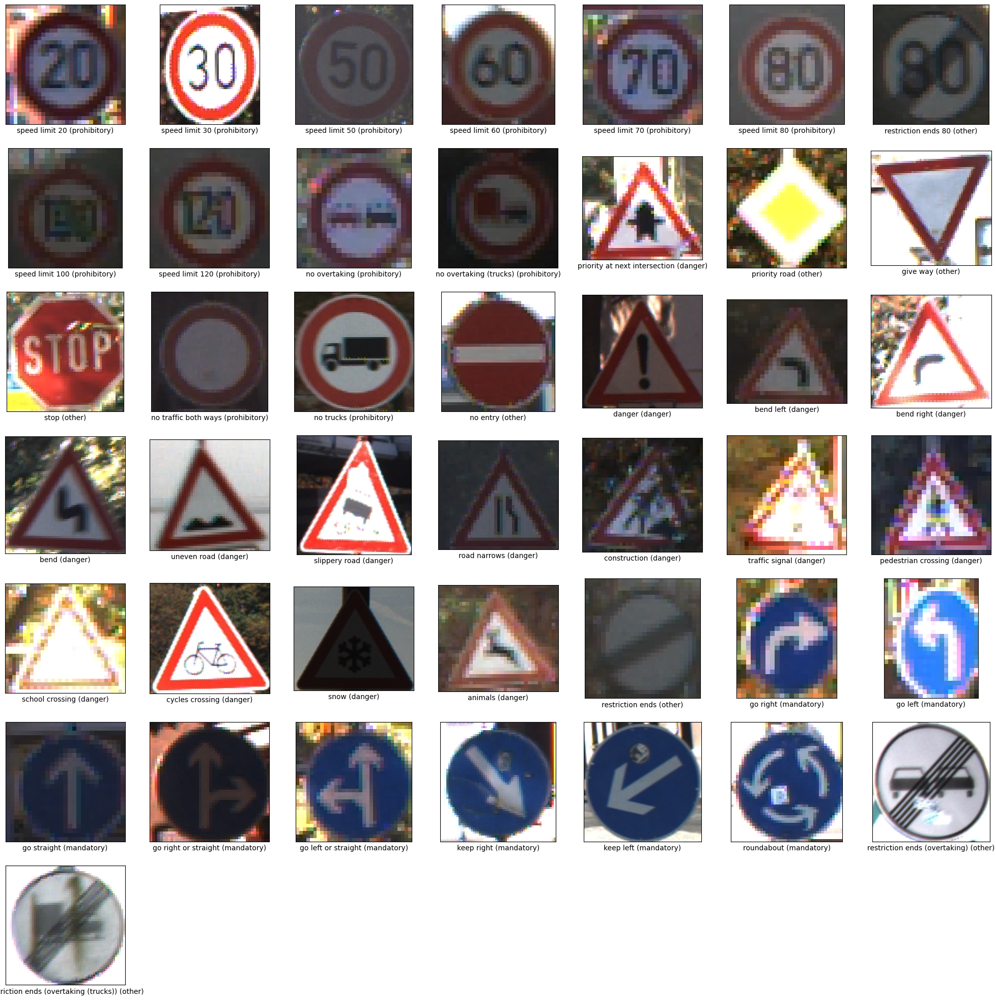

In [ ]:
plt.figure(figsize=(25, 25))
for i in range(len(class_name)):
    images = os.listdir(main_path + '/GTSDB/' + str(i).zfill(2))  # Use zfill to ensure 2-digit folder names
    if images:  # Check if the directory is not empty
        plt.subplot(7, 7, i + 1)
        plt.grid(False)
        plt.xticks([])
        plt.yticks([])
        plt.xlabel(class_name[i])
        image = cv2.imread(os.path.join(main_path, 'GTSDB/' + str(i).zfill(2) + '/' + images[0]))
        if image is not None:  # Check if the image was loaded successfully
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        else:
            print(f"Could not load image for class {i}: {os.path.join(main_path, 'GTSDB/' + str(i).zfill(2) + '/' + images[0])}")
    else:
        print(f"Directory for class {i} is empty.")

# File importing for the scenes

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/GermanSignDetection/GTSDB/gt.txt', sep=';', header=None)
data.rename(columns={
    0: 'Path',
    5: 'Class_id',
    1: 'X_min',
    2: 'Y_min',
    3: 'X_max',
    4: 'Y_max'
}, inplace=True)
data['Path'] = data['Path'].str.replace('.ppm', '')
data['Path'] = data['Path'].astype(int)
data

,Path,X_min,Y_min,X_max,Y_max,Class_id
0,0,774,411,815,446,11
1,1,983,388,1024,432,40
2,1,386,494,442,552,38
3,1,973,335,1031,390,13
4,2,892,476,1006,592,39
...,...,...,...,...,...,...
1208,896,808,412,846,450,15
1209,897,804,526,828,550,42
1210,898,323,504,355,536,4
1211,898,817,510,849,542,4


Number of images having a sign :  741
Index([1, 2, 3, 4, 6, 5], dtype='int64', name='Class_id')
[396 256  54  33   1   1]


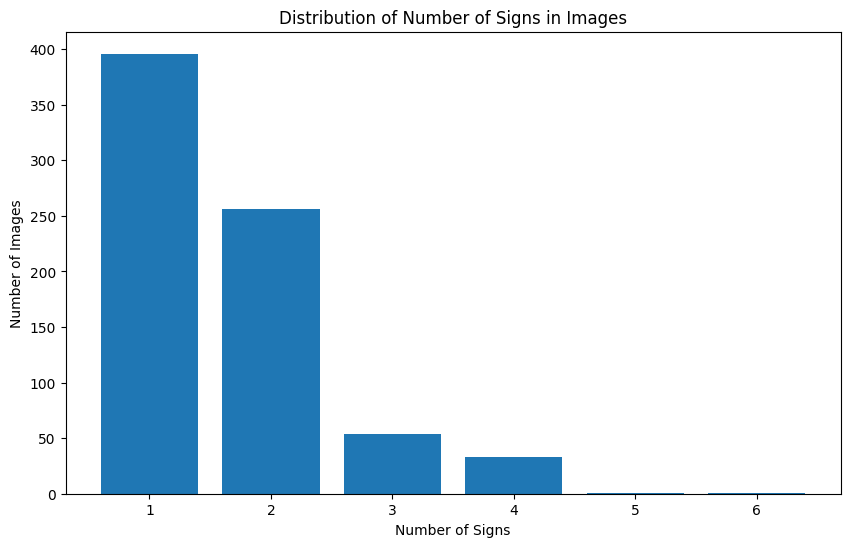

In [ ]:
sign_counts = data.groupby('Path')['Class_id'].count()

# Create a bar plot showing the distribution of sign counts
print('Number of images having a sign : ', len(sign_counts))
print(sign_counts.value_counts().index)
print(sign_counts.value_counts().values)
plt.figure(figsize=(4, 3))
plt.hist(sign_counts, bins=range(min(sign_counts), max(sign_counts) + 2), align='left', rwidth=0.8)
plt.xlabel("Number of Signs")
plt.ylabel("Number of Images")
plt.title("Distribution of Number of Signs in Images")
plt.show()

In [ ]:

import os

# Assuming GTSDB folder is in the specified path
gtsdb_path = '/content/drive/MyDrive/GermanSignDetection/GTSDB'

# Count .ppm files
ppm_count = 0
for root, _, files in os.walk(gtsdb_path):
    for file in files:
        if file.endswith(".ppm"):
            ppm_count += 1
            print(ppm_count)

print(f"Number of .ppm files in GTSDB: {ppm_count}")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [ ]:
# converting all the ppm files in the folder to jpg format
def convert_ppm_to_jpg(folder):
  """Converts all .ppm files in a folder to .jpg format.

  Args:
    input_folder: The path to the folder containing .ppm files.
    output_folder: The path to the folder where .jpg files will be saved.
  """

  for filename in os.listdir(folder):
    if filename.endswith(".ppm"):
      input_path = os.path.join(folder, filename)
      output_path = os.path.join(folder, os.path.splitext(filename)[0] + ".jpg")

      try:
        img = cv2.imread(input_path)
        cv2.imwrite(output_path, img)
        # print(f"Converted {input_path} to {output_path}")
      except Exception as e:
        print(f"Error converting {input_path}: {e}")

# Example usage:
input_folder = '/content/drive/MyDrive/GermanSignDetection/GTSDB'

convert_ppm_to_jpg(input_folder)

Converted /content/drive/MyDrive/GermanSignDetection/GTSDB/00851.ppm to /content/drive/MyDrive/GermanSignDetection/GTSDB/00851.jpg
Converted /content/drive/MyDrive/GermanSignDetection/GTSDB/00856.ppm to /content/drive/MyDrive/GermanSignDetection/GTSDB/00856.jpg
Converted /content/drive/MyDrive/GermanSignDetection/GTSDB/00854.ppm to /content/drive/MyDrive/GermanSignDetection/GTSDB/00854.jpg
Converted /content/drive/MyDrive/GermanSignDetection/GTSDB/00853.ppm to /content/drive/MyDrive/GermanSignDetection/GTSDB/00853.jpg
Converted /content/drive/MyDrive/GermanSignDetection/GTSDB/00852.ppm to /content/drive/MyDrive/GermanSignDetection/GTSDB/00852.jpg
Converted /content/drive/MyDrive/GermanSignDetection/GTSDB/00855.ppm to /content/drive/MyDrive/GermanSignDetection/GTSDB/00855.jpg
Converted /content/drive/MyDrive/GermanSignDetection/GTSDB/00857.ppm to /content/drive/MyDrive/GermanSignDetection/GTSDB/00857.jpg
Converted /content/drive/MyDrive/GermanSignDetection/GTSDB/00860.ppm to /content/dr

In [ ]:
scene_folder_path = '/content/drive/MyDrive/GermanSignDetection/GTSDB'  # Replace with the actual path
image_list = []

for filename in os.listdir(scene_folder_path):
  if filename.endswith(('.jpg')):
    image_list.append(os.path.join(scene_folder_path, filename))
print('We have 741 label boxes, but the total number of images are : ', len(image_list))

We have 741 label boxes, but the total number of images are :  900


/content/drive/MyDrive/GermanSignDetection/GTSDB/00002.jpg


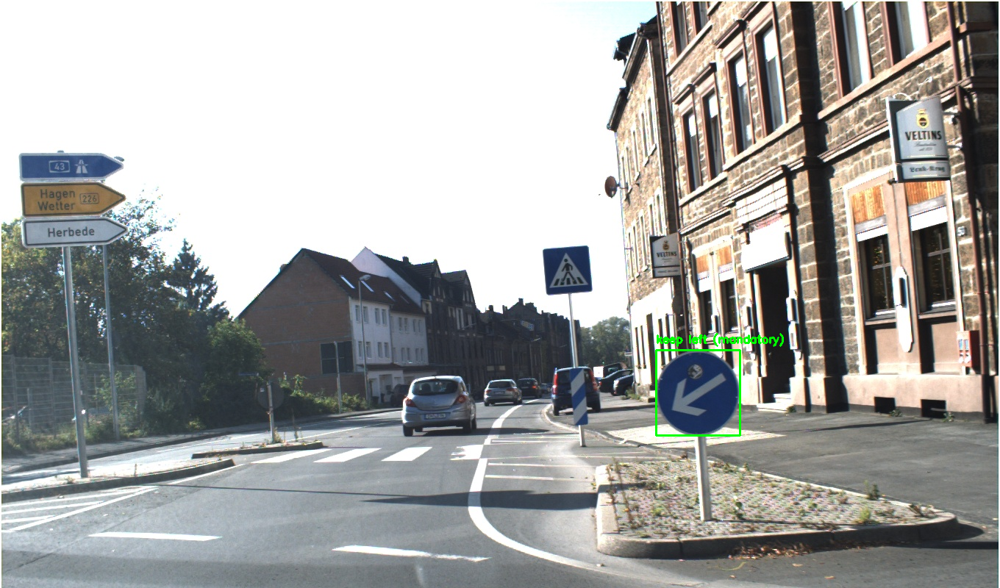

<Figure size 800x600 with 0 Axes>

/content/drive/MyDrive/GermanSignDetection/GTSDB/00000.jpg


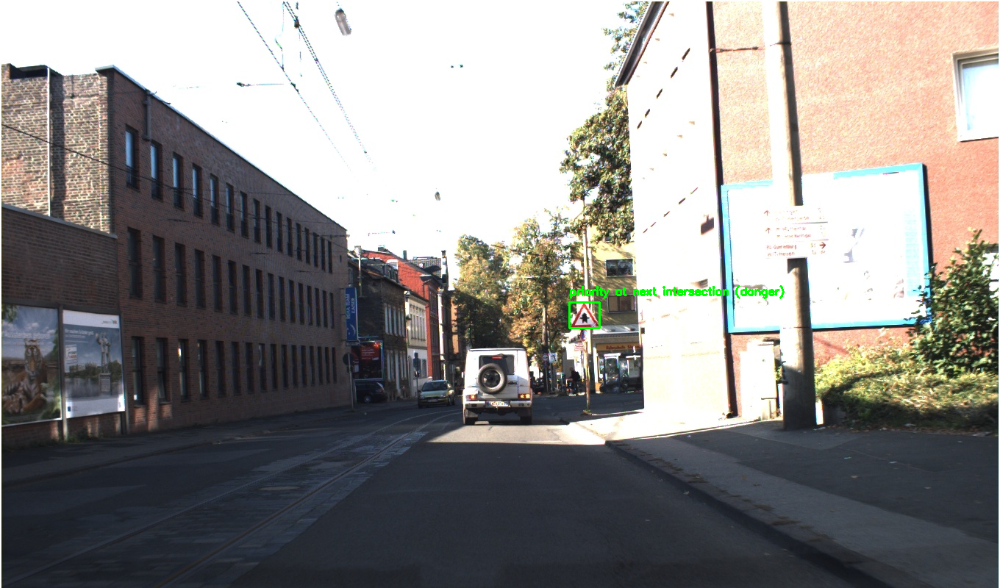

<Figure size 800x600 with 0 Axes>

/content/drive/MyDrive/GermanSignDetection/GTSDB/00006.jpg


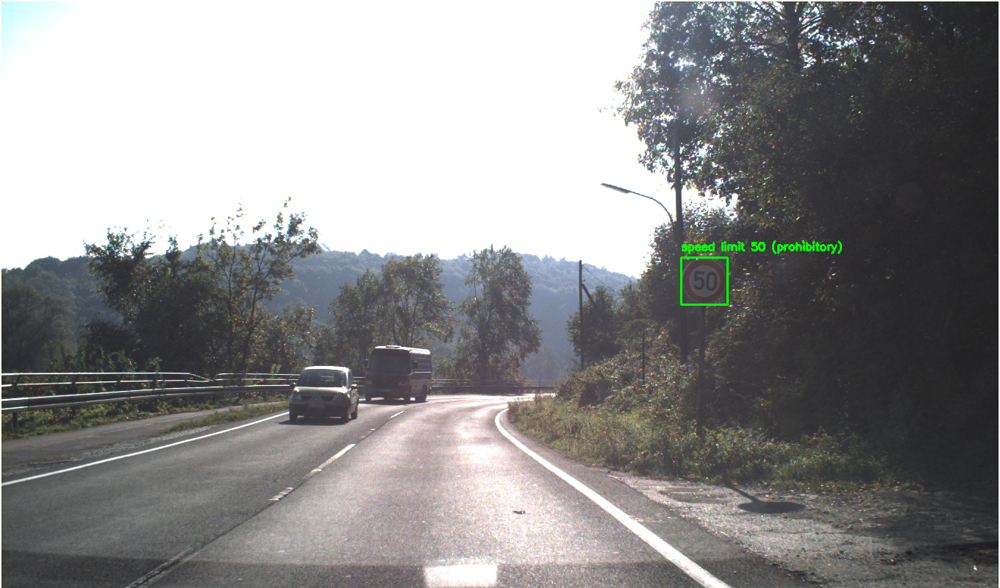

<Figure size 800x600 with 0 Axes>

/content/drive/MyDrive/GermanSignDetection/GTSDB/00004.jpg


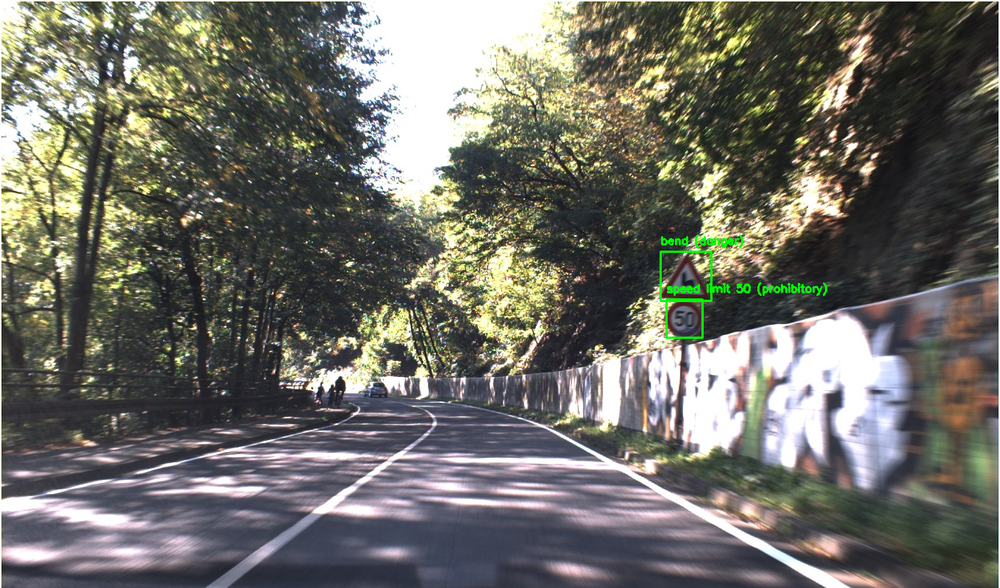

<Figure size 800x600 with 0 Axes>

/content/drive/MyDrive/GermanSignDetection/GTSDB/00028.jpg


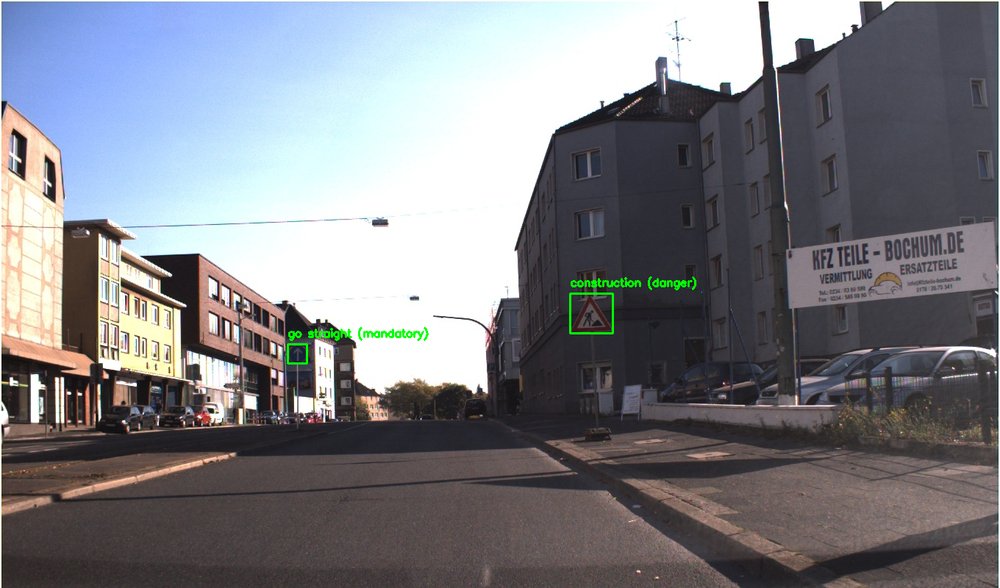

<Figure size 800x600 with 0 Axes>

In [ ]:
def draw_label_boxes(image_path, data):
  """Draws label boxes on an image based on the provided data."""
  image = cv2.imread(image_path)
  image_filename = os.path.basename(image_path)
  image_filename = int(os.path.splitext(image_filename)[0])
  row_data = data[data['Path'] == image_filename]
  for _, row in row_data.iterrows():
    x_min, y_min, x_max, y_max = int(row['X_min']), int(row['Y_min']), int(row['X_max']), int(row['Y_max'])
    class_id = int(row['Class_id'])
    label_name = class_dict.get(class_id, "Unknown")  # Get label name from dictionary

    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    cv2.putText(image, label_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
  return image

# Draw label boxes on a few images from the image_list
for image_path in image_list[:5]:
  plt.figure(figsize=(8, 6))
  print(image_path)
  image_with_boxes = draw_label_boxes(image_path, data)
  cv2_imshow(image_with_boxes)
  plt.show()

Total Number of Signs :  1213
Number of Images in the data file:  741


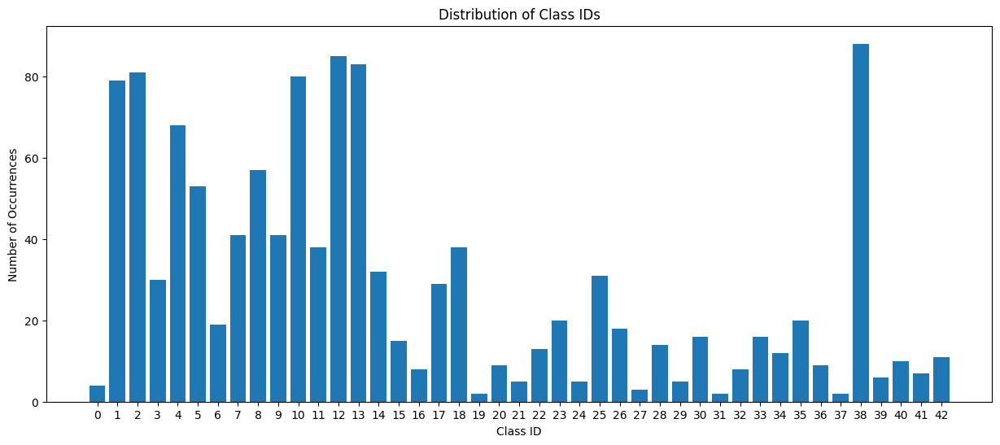

In [ ]:
class_counts = data['Class_id'].value_counts()
print('Total Number of Signs : ', class_counts.sum())
print("Number of Images in the data file: ", data['Path'].nunique())

plt.figure(figsize=(15, 6))
plt.bar(class_counts.index, class_counts.values)
plt.xlabel("Class ID")
plt.ylabel("Number of Occurrences")
plt.title("Distribution of Class IDs")
plt.xticks(range(43))  # Ensure all class IDs (0-42) are shown on the x-axis
plt.show()

In [ ]:
# as there are 43 different types of signs in the csv file, making a detection model using such small number of sign images will be difficult
# hence we conver the signs to 4 different class ids
new_class_dict = {
    0: "prohibitory",
    1: "danger",
    2: "mandatory",
    3: "other"
}

def convert_class_id(old_class_id):
  if old_class_id in [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 15, 16]:
    return 0  # Prohibitory
  elif old_class_id in [11, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]:
    return 1  # Danger
  elif old_class_id in [33, 34, 35, 36, 37, 38, 39, 40]:
    return 2  # Mandatory
  else:
    return 3  # Other


new_data = data.copy()
new_data['New_Class_id'] = new_data['Class_id'].apply(convert_class_id)
new_data = new_data.drop('Class_id', axis=1)
new_data = new_data.rename(columns={'New_Class_id': 'Class_id'})
print('Number of Unique class IDs',new_data.Class_id.value_counts())


Number of Unique class IDs Class_id
0    557
3    274
1    219
2    163
Name: count, dtype: int64


Total Number of Signs :  1213
Number of Images in the data file:  741


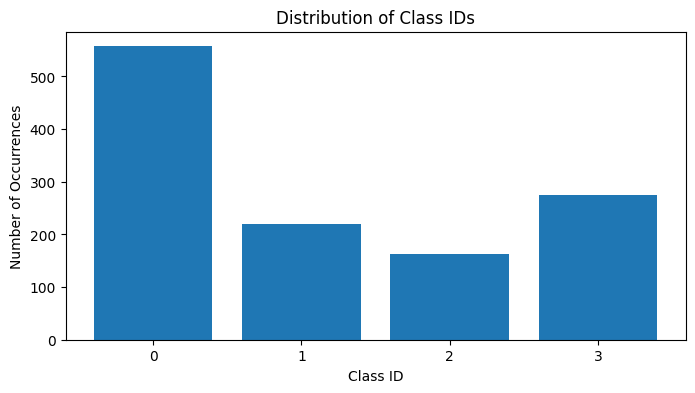

In [ ]:
class_counts = new_data['Class_id'].value_counts()
print('Total Number of Signs : ', class_counts.sum())
print("Number of Images in the data file: ", new_data['Path'].nunique())

plt.figure(figsize=(8, 4))
plt.bar(class_counts.index, class_counts.values)
plt.xlabel("Class ID")
plt.ylabel("Number of Occurrences")
plt.title("Distribution of Class IDs")
plt.xticks(range(4))
plt.show()

In [ ]:
unique_image_paths = new_data['Path'].unique()
X = [os.path.join(scene_folder_path, str(path) + '.jpg') for path in unique_image_paths]
print('Number of total images with signs',len(X))
print('There are a total of 900 images, but only ', len(unique_image_paths), 'images have signs')

Number of total images with signs 741
There are a total of 900 images, but only  741 images have signs


In [ ]:
y = new_data.groupby('Path')['Class_id'].apply(list).reset_index()
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y['Class_id'].apply(lambda x: x[0] if x else None), random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp['Class_id'].apply(lambda x: x[0] if x else None), random_state=42)

print(f"Train set size: {len(X_train)}")
print(f"Validation set size: {len(X_val)}")
print(f"Test set size: {len(X_test)}")

Train set size: 518
Validation set size: 111
Test set size: 112


In [ ]:
folders = ['train', 'val', 'test']
for folder in folders:
    os.makedirs(os.path.join(main_path, 'dataset/images', folder), exist_ok=True)
    os.makedirs(os.path.join(main_path, 'dataset/labels', folder), exist_ok=True)

In [ ]:
def convert_txt_boxes(row, file):
  """
  Converts label box data to YOLO format and writes it to a file.

  Args:
    row: A pandas Series containing label information for a single box.
    file: The file object to write the YOLO format data to.
  """
  x_min, y_min, x_max, y_max = int(row['X_min']), int(row['Y_min']), int(row['X_max']), int(row['Y_max'])
  class_id = int(row['Class_id'])

  img_width = 1360
  img_height = 800

  x_center = ((x_min + x_max) / 2) / img_width
  y_center = ((y_min + y_max) / 2) / img_height
  width = (x_max - x_min) / img_width
  height = (y_max - y_min) / img_height

  file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

In [ ]:
def copy_images_and_create_txt_files(image_list, label_data, output_image_folder, output_label_folder):
  """
  Copies images and creates corresponding text files for YOLO training.

  Args:
    image_list: A list of image paths.
    label_data: A pandas DataFrame containing label information.
    output_image_folder: The folder where images will be copied.
    output_label_folder: The folder where text files will be created.
  """
  for image_path in tqdm(image_list):

      image_filename = os.path.basename(image_path) # 481.ppm

      image_no = os.path.splitext(image_filename)[0] # 481
      image_path = os.path.join(main_path, 'GTSDB', image_no.zfill(5) + '.jpg') # 00581.ppm

      new_image_path = os.path.join(output_image_folder, image_filename)


      # copying the image file
      shutil.copy(image_path, new_image_path)


      row_data = label_data[label_data['Path'] == int(image_no)]

      if not row_data.empty:
          txt_filename = str(image_no) + ".txt"
          txt_filepath = os.path.join(output_label_folder, txt_filename)
          with open(txt_filepath, "w") as f:
              for _, row in row_data.iterrows():
                  convert_txt_boxes(row, f)

# Copy images and generate labels for train, val, and test sets.

copy_images_and_create_txt_files(X_train, new_data, os.path.join(main_path, 'dataset/images/train'), os.path.join(main_path, 'dataset/labels/train'))
copy_images_and_create_txt_files(X_val, new_data, os.path.join(main_path, 'dataset/images/val'), os.path.join(main_path, 'dataset/labels/val'))
copy_images_and_create_txt_files(X_test, new_data, os.path.join(main_path, 'dataset/images/test'), os.path.join(main_path, 'dataset/labels/test'))

In [ ]:
y_train_list = [item[0] for item in y_train['Class_id'].tolist()]
y_val_list = [item[0] for item in y_val['Class_id'].tolist()]
y_test_list = [item[0] for item in y_test['Class_id'].tolist()]

train_class, train_counts = np.unique(y_train_list, return_counts=True)
test_class, test_counts = np.unique(y_test_list, return_counts=True)
val_class, val_counts = np.unique(y_val_list, return_counts=True)

plt.figure(figsize=(4, 4))
plt.bar(train_class, train_counts, label='Train Split')
plt.bar(val_class, val_counts, bottom=train_counts, label='Val Split')
plt.bar(test_class, test_counts, bottom=np.array(train_counts) + np.array(val_counts), label='Test Split')
plt.legend(['Train Split', 'Val Split', 'Test Split'], loc='upper right')
plt.title('Class Distribution of Train, Test and Validation Data')
plt.xlabel('Class No. ')
plt.ylabel('Number of Images')
plt.show()

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.3/887.3 kB 24.8 MB/s eta 0:00:00


In [ ]:
import ultralytics
from ultralytics import YOLO
from ultralytics import settings
settings.update({'wandb': True})

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model = YOLO(os.path.join(main_path,'yolov8n.pt'))

In [ ]:
# Properly formatted dataset YAML content
dataset_yaml = f"""
path: {main_path}/dataset
train: images/train
val: images/val
test: images/test

nc: 4
names:
    0: prohibitory,
    1: danger,
    2: mandatory,
    3: other
"""

with open(os.path.join(main_path, 'dataset.yaml'), 'w') as f:
    f.write(dataset_yaml)

In [ ]:
results = model.train(
    data=os.path.join(main_path, 'dataset.yaml'),
    epochs=200,
    imgsz=640,
    batch=32,
    patience=20,
    project="GTSDB",
    name='YOLO_V8_N',
    optimizer='AdamW',
    lr0=0.0001,
    plots=True,
    verbose=True,
    augment=True,
    mosaic = 1,
    flipud = 0.5,
    fliplr = 0.5,
    hsv_h = 0.015,
    hsv_s = 0.7,
    hsv_v = 0.4
)
# d32608f2cb8f54648442d1d8288589065eb0fa14

Ultralytics 8.3.36 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/GermanSignDetection/yolov8n.pt, data=/content/drive/MyDrive/GermanSignDetection/dataset.yaml, epochs=200, time=None, patience=20, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=GTSDB, name=YOLO_V8_N5, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

100%|██████████| 755k/755k [00:00<00:00, 22.3MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

In [ ]:
model.save('GTSD_Model')

In [ ]:
val_results = model.val()

In [ ]:
# Properly formatted dataset YAML content
test_yaml = f"""
path: {main_path}/dataset
train: images/train
val: images/test
test: images/val

nc: 4
names:
    0: prohibitory,
    1: danger,
    2: mandatory,
    3: other
"""

with open(os.path.join(main_path, 'dataset.yaml'), 'w') as f:
    f.write(test_yaml)

In [ ]:
test_results = model.val(data = os.path.join(main_path, 'test.yaml'))